<a href="https://colab.research.google.com/github/missalt/dlo-modeling/blob/main/dlo_modelling_bi_LSTM_Transformers_E2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import math
import os
import random
from typing import Tuple
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

In [ ]:
data = np.load('/content/3000_rope_states_actions.npz', allow_pickle=True)
data

NpzFile '/content/3000_rope_states_actions.npz' with keys: states, actions, link_index, link_names, meta

In [ ]:
pip list

Package                                  Version
---------------------------------------- --------------------
absl-py                                  1.4.0
absolufy-imports                         0.3.1
accelerate                               1.10.1
aiofiles                                 24.1.0
aiohappyeyeballs                         2.6.1
aiohttp                                  3.13.0
aiosignal                                1.4.0
alabaster                                1.0.0
albucore                                 0.0.24
albumentations                           2.0.8
ale-py                                   0.11.2
alembic                                  1.17.0
altair                                   5.5.0
annotated-types                          0.7.0
antlr4-python3-runtime                   4.9.3
anyio                                    4.11.0
anywidget                                0.9.18
argon2-cffi                              25.1.0
argon2-cffi-bindings              

In [ ]:
actions = data['actions']
actions

array([[-3.57345678e-02,  8.59309807e-02,  8.83282572e-02,
         1.90000000e+01],
       [ 1.22371120e-02,  7.94255058e-04,  4.60578827e-04,
         6.00000000e+00],
       [-4.55787126e-03,  1.73282868e-03, -1.36700962e-02,
         4.00000000e+01],
       ...,
       [ 2.37461459e-02, -2.07966324e-02,  2.12916530e-05,
         4.40000000e+01],
       [ 5.46282856e-03, -1.60923302e-02, -3.65524698e-04,
         4.30000000e+01],
       [ 3.33784474e-03, -1.14536295e-02, -1.04987295e-04,
         4.10000000e+01]], dtype=float32)

In [ ]:
rope_states = data['states']
rope_states

array([[[-9.40380525e-03,  4.20324458e-03,  8.34025443e-03],
        [-1.15744481e-02,  1.39191756e-02,  9.28312261e-03],
        [-1.35531304e-02,  2.37141773e-02,  9.66093224e-03],
        ...,
        [ 3.85587849e-02,  1.76712424e-02,  9.56937578e-03],
        [ 3.51054631e-02,  8.28643981e-03,  9.56393033e-03],
        [ 3.18740830e-02, -1.17697008e-03,  9.51870997e-03]],

       [[-1.07273404e-02,  4.08764789e-03,  9.14847944e-03],
        [-1.25737153e-02,  1.39002567e-02,  9.69948713e-03],
        [-1.41933905e-02,  2.37673279e-02,  9.83196124e-03],
        ...,
        [ 3.56413759e-02,  2.21461281e-02,  9.25344229e-03],
        [ 3.27417962e-02,  1.25761069e-02,  9.33776610e-03],
        [ 3.01071517e-02,  2.92944512e-03,  9.36176814e-03]],

       [[-1.48880174e-02,  3.36504495e-03,  7.48746097e-03],
        [-1.47913042e-02,  1.32682212e-02,  8.87228735e-03],
        [-1.41908275e-02,  2.32226402e-02,  9.61321127e-03],
        ...,
        [ 3.73143107e-02,  2.67386492e-02,

In [ ]:
data['link_names']

array(['link_0', 'link_1', 'link_2', 'link_3', 'link_4', 'link_5',
       'link_6', 'link_7', 'link_8', 'link_9', 'link_10', 'link_11',
       'link_12', 'link_13', 'link_14', 'link_15', 'link_16', 'link_17',
       'link_18', 'link_19', 'link_20', 'link_21', 'link_22', 'link_23',
       'link_24', 'link_25', 'link_26', 'link_27', 'link_28', 'link_29',
       'link_30', 'link_31', 'link_32', 'link_33', 'link_34', 'link_35',
       'link_36', 'link_37', 'link_38', 'link_39', 'link_40', 'link_41',
       'link_42', 'link_43', 'link_44', 'link_45', 'link_46', 'link_47',
       'link_48', 'link_49', 'link_50', 'link_51', 'link_52', 'link_53',
       'link_54', 'link_55', 'link_56', 'link_57', 'link_58', 'link_59',
       'link_60', 'link_61', 'link_62', 'link_63', 'link_64', 'link_65',
       'link_66', 'link_67', 'link_68', 'link_69'], dtype=object)

In [ ]:
"""
Rope state predictor (Transformer encoder-decoder)

This is a self-contained baseline PyTorch implementation that:
- Converts per-timestep action vectors (shape: 4 => dx,dy,dz,link_index) into a per-link action map
- Builds an encoder-decoder Transformer model (in spirit similar to Whisper's encoder-decoder layout)
- Trains to predict rope_states[t+1] given rope_states[t] and the action applied at time t

ASSUMPTIONS
- rope_states: numpy array or torch tensor with shape (N, L, 3) where N = timesteps (500), L = links (70)
- actions: numpy array or torch tensor with shape (N, 4), where action[:3] is a push vector and action[3]
  indicates the link index that was acted on (integer-like). If your actions are different, adapt
  `_action_to_per_link` in RopeDataset.

How it works (brief):
- For each sample index t we use src = rope_states[t], tgt_target = rope_states[t+1].
- We turn the single action vector for timestep t into a per-link vector of dimension 4: (dx,dy,dz,flag)
  where 'flag' == 1.0 on the link that was pushed and 0 otherwise. This per-link action is concatenated
  with each link's xyz and fed to the encoder.
- The decoder receives the current rope_state (same as encoder 'src') as "previous tokens" (teacher forcing)
  and learns to output the next rope_state for each link in parallel. This is a simple sequence-to-sequence
  setup appropriate for frame-to-frame prediction; you can extend to autoregressive generation if desired.

To run: fill `rope_states_np` and `actions_np` with your data and run `python rope_transformer.py`.
"""

'\nRope state predictor (Transformer encoder-decoder)\n\nThis is a self-contained baseline PyTorch implementation that:\n- Converts per-timestep action vectors (shape: 4 => dx,dy,dz,link_index) into a per-link action map\n- Builds an encoder-decoder Transformer model (in spirit similar to Whisper\'s encoder-decoder layout)\n- Trains to predict rope_states[t+1] given rope_states[t] and the action applied at time t\n\nASSUMPTIONS\n- rope_states: numpy array or torch tensor with shape (N, L, 3) where N = timesteps (500), L = links (70)\n- actions: numpy array or torch tensor with shape (N, 4), where action[:3] is a push vector and action[3]\n  indicates the link index that was acted on (integer-like). If your actions are different, adapt\n  `_action_to_per_link` in RopeDataset.\n\nHow it works (brief):\n- For each sample index t we use src = rope_states[t], tgt_target = rope_states[t+1].\n- We turn the single action vector for timestep t into a per-link vector of dimension 4: (dx,dy,dz,fl

In [ ]:
actions[0].shape

(4,)

In [ ]:
# ---------------------------- Dataset -------------------------------------


class RopeDataset(Dataset):
    """Dataset that yields (src_state, action_per_link, tgt_next_state).

    - src_state: (L, 3)
    - action_per_link: (L, 4)  -> (dx,dy,dz,flag)
    - tgt_next_state: (L, 3)

    Normalization:
    - When `normalize=True`, mean/std are computed from this dataset.
    - When `normalize=False`, use externally provided `mean` and `std` (from training set).
    """

    def __init__(
        self,
        rope_states: "np.ndarray | torch.Tensor",
        actions: "np.ndarray | torch.Tensor",
        normalize: bool = True,
        mean: torch.Tensor | None = None,
        std: torch.Tensor | None = None,
    ):
        # Convert to tensor
        states = torch.as_tensor(rope_states, dtype=torch.float32)
        actions = torch.as_tensor(actions, dtype=torch.float32)

        assert states.ndim == 3 and states.shape[2] == 3, "rope_states must be (N, L, 3)"
        assert actions.ndim == 2 and actions.shape[1] >= 4, "actions must be (N, 4) or more"
        assert states.shape[0] == actions.shape[0], "Batch dimension must match"

        self.states = states
        self.actions = actions
        self.N = states.shape[0]
        self.L = states.shape[1]

        # --- Normalization logic ---
        if normalize:
            # Compute mean and std only from this dataset
            self.mean = self.states.mean(dim=(0, 1), keepdim=True)  # (1,1,3)
            self.std = self.states.std(dim=(0, 1), keepdim=True) + 1e-8
        else:
            # Use provided stats from training data
            assert mean is not None and std is not None, \
                "When normalize=False, you must provide mean and std from the training set."
            self.mean = mean
            self.std = std

        # Normalize states using mean/std
        self.states = (self.states - self.mean) / self.std

    def __len__(self):
        # Predict t+1 from t, so last valid index is N-2
        return self.N - 1

    def __getitem__(self, idx: int) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
        src = self.states[idx]          # (L, 3)
        tgt_next = self.states[idx + 1] # (L, 3)
        action = self.actions[idx]      # (4,)
        action_map = self._action_to_per_link(action)
        return src, action_map, tgt_next

    def _action_to_per_link(self, action: torch.Tensor) -> torch.Tensor:
        """Convert action vector (4,) into a per-link map (L,4)."""
        amap = torch.zeros(self.L, 4, dtype=torch.float32)
        idx = int(round(float(action[3].item())))
        idx = max(0, min(self.L - 1, idx))
        amap[idx, :3] = action[:3]
        amap[idx, 3] = action[1]
        return amap

In [ ]:


# ---------------------------- Utilities -----------------------------------

def set_seed(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)


class PositionalEncoding(nn.Module):
    """Standard sinusoidal positional encoding for sequences (per-link positions).
    Input/outputs use shape (batch, seq_len, d_model).
    """

    def __init__(self, d_model: int, max_len: int = 5000):
        super().__init__()
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float32).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2, dtype=torch.float32) * -(math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0)  # shape (1, max_len, d_model)
        self.register_buffer("pe", pe)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # x: (batch, seq_len, d_model)
        x = x + self.pe[:, : x.size(1), :]
        return x

class LearnedPositionalEncoding(nn.Module):
    def __init__(self, max_len: int, d_model: int):
        super().__init__()
        self.pos_emb = nn.Parameter(torch.zeros(1, max_len, d_model))
        nn.init.normal_(self.pos_emb, std=0.02)

    def forward(self, x):
        return x + self.pos_emb[:, :x.size(1)]

# ---------------------------- Model ---------------------------------------

class RopeTransformer(nn.Module):
    """Encoder-decoder transformer that maps (state_t, action_t) -> state_{t+1} (per link coordinates).

    Encoder input dim = 3 (xyz) + 4 (per-link action map) = 7
    Decoder input dim = 3 (xyz) as 'previous tokens' (teacher forcing)
    Output projected to 3 dims (xyz)
    """

    def __init__(
        self,
        seq_len: int = 70,
        d_model: int = 256,
        nhead: int = 8,
        num_encoder_layers: int = 3,
        num_decoder_layers: int = 3,
        dim_feedforward: int = 512,
        num_lstm_layers = 1,
        dropout: float = 0.1,
    ):
        super().__init__()
        self.d_model = d_model
        self.seq_len = seq_len

        # input projection
        self.enc_input_fc = nn.Linear(7, d_model)
        self.dec_input_fc = nn.Linear(3, d_model)  # decoder sees previous xyz coordinates
        self.pos_enc = LearnedPositionalEncoding(seq_len+4, d_model)
        #self.pos_enc = PositionalEncoding(d_model, max_len=seq_len)

        # Transformer core
        try:
            self.transformer = nn.Transformer(
                d_model=d_model,
                nhead=nhead,
                num_encoder_layers=num_encoder_layers,
                num_decoder_layers=num_decoder_layers,
                dim_feedforward=dim_feedforward,
                dropout=dropout,
                batch_first=True,
            )
            self._use_batch_first = True
        except TypeError:
            self.transformer = nn.Transformer(
                d_model=d_model,
                nhead=nhead,
                num_encoder_layers=num_encoder_layers,
                num_decoder_layers=num_decoder_layers,
                dim_feedforward=dim_feedforward,
                dropout=dropout,
            )
            self._use_batch_first = False

        # Bidirectional LSTM head
        if num_lstm_layers > 0:
          self.bi_lstm = nn.LSTM(
              input_size=d_model,
              hidden_size=d_model // 2,  # since bidirectional, output dim = d_model
              num_layers= num_lstm_layers,
              batch_first=True,
              bidirectional=True,
          )
        else:
          self.bi_lstm = None

        # Project LSTM output to xyz delta
        self.output_fc = nn.Linear(d_model, 3)

    def forward(self, src_state: torch.Tensor, action_map: torch.Tensor, decoder_inputs: torch.Tensor = None) -> torch.Tensor:
        """Forward pass.

        Args:
            src_state: (batch, L, 3)
            action_map: (batch, L, 6)
            decoder_inputs: (batch, L, 3)  - typically the same as src_state for teacher forcing

        Returns:
            pred_next_state: (batch, L, 3)
        """
        batch = src_state.size(0)

        # --- Encode ---
        src_cat = torch.cat([src_state, action_map], dim=-1)  # (batch, L, 6)
        src_emb = self.enc_input_fc(src_cat) * math.sqrt(self.d_model)
        src_emb = self.pos_enc(src_emb)

        # --- Decode ---
        if decoder_inputs is None:
            decoder_inputs = src_state  # teacher forcing fallback

        tgt_emb = self.dec_input_fc(decoder_inputs) * math.sqrt(self.d_model)
        tgt_emb = self.pos_enc(tgt_emb)

        # Transformer forward
        if self._use_batch_first:
            out = self.transformer(src_emb, tgt_emb)  # (batch, L, d_model)
        else:
            out = self.transformer(src_emb.permute(1, 0, 2), tgt_emb.permute(1, 0, 2)).permute(1, 0, 2)

        # --- Temporal modeling ---
        if self.bi_lstm is not None:
          out, _ = self.bi_lstm(out)
        delta = self.output_fc(out)  # (batch, L, 3)

        # --- Residual connections ---
        # Combine deltas with residuals from both state and actions
        # action_res = self.action_res_fc(action_map)  # (batch, L, 3)
        pred_next_state = src_state + delta

        return pred_next_state






In [ ]:
def split_data(rope_states, actions, train_ratio=0.8, val_ratio=0.1, seed=42):
    """
    Split the dataset into train, validation, and test sets.
    Ensures rope_states and actions remain aligned.
    """
    np.random.seed(seed)
    n = len(rope_states) - 50
    indices = np.random.permutation(n)
    #indices = range(len(rope_states))
    n_train = int(train_ratio * n)
    n_val = int(val_ratio * n)
    n_test = n - n_train - n_val

    train_idx = indices[:n_train]
    val_idx = indices[n_train:n_train + n_val]
    test_idx = indices[n_train + n_val:]

    rope_train, rope_val, rope_test = rope_states[train_idx], rope_states[val_idx], rope_states[test_idx]
    actions_train, actions_val, actions_test = actions[train_idx], actions[val_idx], actions[test_idx]

    rope_demo, actions_demo = rope_states[-50:], actions[-50:]
    return (rope_train, rope_val, rope_test), (actions_train, actions_val, actions_test), (rope_demo, actions_demo)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import os


def train(
    model: nn.Module,
    train_dataset,
    val_dataset,
    device: torch.device = torch.device("cuda" if torch.cuda.is_available() else "cpu"),
    batch_size: int = 16,
    epochs: int = 100,
    lr: float = 1e-4,
    weight_decay: float = 1e-6,
    log_every: int = 10,
    checkpoint_path: str = "best_model.pt",
):
    """
    Train the model and save the best checkpoint based on validation loss.
    """

    train_losses = []
    val_losses = []
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    model.to(device)
    opt = optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)
    criterion = nn.MSELoss()

    best_val_loss = float("inf")

    for epoch in range(1, epochs + 1):
        model.train()
        running_loss = 0.0

        for i, (src, action_map, tgt_next) in enumerate(train_loader):
            src = src.to(device)
            action_map = action_map.to(device)
            tgt_next = tgt_next.to(device)

            opt.zero_grad()
            pred = model(src, action_map, decoder_inputs=src)

            # delta_pred = pred - src
            # delta_true = tgt_next - src
            loss = criterion(pred, tgt_next)
            # loss = criterion(pred, tgt_next) + 1.0*criterion(delta_pred, delta_true)
            # loss = 1.0*criterion(delta_pred, delta_true)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            opt.step()

            running_loss += loss.item()
            # if (i + 1) % log_every == 0:
            #     avg = running_loss / log_every
            #     running_loss = 0.0

        # Validation step
        val_loss = evaluate(model, val_loader, device=device, load_best=False)
        print(f"Epoch {epoch:03d} finished. Train Loss: {running_loss/len(train_loader):.3f}.Validation MSE={val_loss:.6f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save(model.state_dict(), checkpoint_path)
            print(f"✅ Saved new best model (MSE={val_loss:.6f}) at '{checkpoint_path}'")

    model.load_state_dict(torch.load(checkpoint_path, map_location=device))
    print(f"🔁 Loaded best model from '{checkpoint_path}' (MSE={best_val_loss:.6f})")

    return model


def evaluate(
    model: nn.Module,
    data_loader: DataLoader,
    device: torch.device = torch.device("cpu"),
    checkpoint_path: str = "best_model.pt",
    load_best: bool = True,
) -> float:
    """
    Evaluate the model. Optionally loads the best checkpoint before evaluation.
    """
    if load_best and os.path.exists(checkpoint_path):
        model.load_state_dict(torch.load(checkpoint_path, map_location=device))
        print(f"📦 Loaded checkpoint from '{checkpoint_path}' for evaluation.")

    model.to(device)
    model.eval()
    criterion = nn.MSELoss(reduction="mean")

    total_loss = 0.0
    count = 0

    with torch.no_grad():
        for src, action_map, tgt_next in data_loader:
            src = src.to(device)
            action_map = action_map.to(device)
            tgt_next = tgt_next.to(device)
            pred = model(src, action_map, decoder_inputs=src)
            total_loss += criterion(pred, tgt_next).item() * src.size(0)
            count += src.size(0)

    return total_loss / count


In [ ]:
import torch
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


def plot_rope_predictions(
    model,
    dataset,
    device=None,
    index: int = 0,
    denormalize: bool = True,
    train_mean: torch.Tensor = None,
    train_std: torch.Tensor = None,
):
    """
    Plot real vs predicted rope states in 3D for a given sample index.

    Args:
        model: Trained model.
        dataset: Dataset split (train/val/test).
        device: torch.device.
        index: Index of the sample to visualize.
        denormalize: Whether to denormalize using training statistics.
        train_mean: Mean tensor from the training set.
        train_std: Std tensor from the training set.
    """

    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model.eval()
    src, action_map, tgt_next = dataset[index]
    src = src.unsqueeze(0).to(device)
    action_map = action_map.unsqueeze(0).to(device)
    tgt_next = tgt_next.unsqueeze(0).to(device)
    with torch.no_grad():
        pred_next = model(src, action_map, decoder_inputs=src)

    # Move to CPU

    pred_next = pred_next.cpu()
    tgt_next = tgt_next.cpu()
    src = src.cpu()
    # ✅ Use training set statistics for de-normalization
    if denormalize:
        if train_mean is None or train_std is None:
            raise ValueError("You must provide train_mean and train_std for correct de-normalization.")
        pred_next = pred_next * train_std + train_mean
        tgt_next = tgt_next * train_std + train_mean
        src = src * train_std + train_mean

    pred_next = pred_next.squeeze(0).cpu()
    tgt_next = tgt_next.squeeze(0).cpu()
    src = src.squeeze(0).cpu()
    # Plot
    fig = plt.figure(figsize=(10, 6))
    ax = fig.add_subplot(111, projection='3d')

    # Initial state
    ax.plot(
        src[:, 0].numpy(), src[:, 1].numpy(), src[:, 2].numpy(),
        'o-', color='green', label='Initial State (t)'
    )

    # Real next state
    ax.plot(
        tgt_next[:, 0].numpy(), tgt_next[:, 1].numpy(), tgt_next[:, 2].numpy(),
        'o-', color='blue', label='Real State (t+1)'
    )

    # Predicted next state
    ax.plot(
        pred_next[:, 0].numpy(), pred_next[:, 1].numpy(), pred_next[:, 2].numpy(),
        'o--', color='red', label='Predicted State (t+1)'
    )

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend()
    ax.set_title(f"Rope State Prediction (Sample {index})")
    plt.tight_layout()
    plt.show()


In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import torch


def animate_rope(
    model,
    dataset,
    start_idx=0,
    steps=50,
    interval=200,
    device=None,
    denormalize=True,
    save=False,
    train_mean: torch.Tensor = None,
    train_std: torch.Tensor = None,
    dynamic_lim: bool = True
):
    """
    Live animation of predicted vs real rope states over multiple timesteps.

    Args:
        model: Trained model.
        dataset: RopeDataset split (e.g., test set).
        start_idx: Starting frame index.
        steps: Number of steps to animate.
        interval: Delay between frames (ms).
        device: torch.device to use.
        denormalize: Whether to denormalize using training statistics.
        save: If True, saves animation to 'rope_animation.mp4'.
        train_mean: Mean tensor from training set.
        train_std: Std tensor from training set.
    """
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model.eval()
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')

    real_line, = ax.plot([], [], [], 'o-', color='blue', label='Real')
    pred_line, = ax.plot([], [], [], 'o--', color='red', label='Predicted')

    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")
    ax.legend(loc="upper left")

    # Optional: dynamic limits using dataset std for scale
    pos = np.array([dataset[i][2] for i in range(steps)])
    if dynamic_lim:
      center = pos.reshape(-1, 3).mean(axis=0)  # [mean_x, mean_y, mean_z]
      std = pos.reshape(-1, 3).std(axis=0)      # [std_x, std_y, std_z]

      # For visualization: use max std across dimensions to get a balanced cube
      lim = std.mean()


      # Apply limits centered around the mean for each axis
      ax.set_xlim([center[0] - lim, center[0] + lim])
      ax.set_ylim([center[1] - lim, center[1] + lim])
      ax.set_zlim([center[2] - lim, center[2] + lim])
    else:
        ax.set_xlim([-1.5, 1.5])
        ax.set_ylim([-1.5, 1.5])
        ax.set_zlim([-1.5, 1.5])

    def init():
        real_line.set_data([], [])
        real_line.set_3d_properties([])
        pred_line.set_data([], [])
        pred_line.set_3d_properties([])
        return real_line, pred_line

    def update(frame):
        idx = start_idx + frame
        if idx >= len(dataset):
            return real_line, pred_line

        src, action_map, tgt_next = dataset[idx]
        src = src.unsqueeze(0).to(device)
        action_map = action_map.unsqueeze(0).to(device)

        with torch.no_grad():
            pred_next = model(src, action_map, decoder_inputs=src)

        pred_next = pred_next.cpu()
        tgt_next = tgt_next.cpu()
        # ✅ Correct de-normalization using *training* stats
        if denormalize:
            tgt_next = tgt_next.unsqueeze(0)
            if train_mean is None or train_std is None:
                raise ValueError("You must provide train_mean and train_std for correct de-normalization.")

            pred_next = pred_next * train_std + train_mean
            tgt_next = tgt_next * train_std + train_mean
            tgt_next = tgt_next.squeeze(0)

        pred_next = pred_next.squeeze(0).cpu()
        real_line.set_data(tgt_next[:, 0], tgt_next[:, 1])
        real_line.set_3d_properties(tgt_next[:, 2])

        pred_line.set_data(pred_next[:, 0], pred_next[:, 1])
        pred_line.set_3d_properties(pred_next[:, 2])

        ax.set_title(f"Frame {idx}")
        return real_line, pred_line

    ani = FuncAnimation(
        fig,
        update,
        frames=min(steps, len(dataset) - start_idx),
        init_func=init,
        blit=False,
        interval=interval,
        repeat=False,
    )

    if save:
        ani.save('rope_animation.mp4', writer='ffmpeg', fps=6)
        print("Saved animation as rope_animation.mp4")
    plt.close(fig)
    return HTML(ani.to_jshtml())


In [ ]:
L = 70
set_seed(42)


# 🔹 Split data into train, val, and test sets
(rope_train, rope_val, rope_test), (actions_train, actions_val, actions_test), (rope_demo, actions_demo) = split_data(rope_states, actions)

# 🔹 Create datasets
train_dataset = RopeDataset(rope_train, actions_train, normalize=True)
val_dataset = RopeDataset(rope_val, actions_val, normalize=False, mean=train_dataset.mean, std=train_dataset.std)
test_dataset = RopeDataset(rope_test, actions_test, normalize=False, mean=train_dataset.mean, std=train_dataset.std)
demo_dataset = RopeDataset(rope_demo, actions_demo, normalize = False, mean=train_dataset.mean, std=train_dataset.std)
# 🔹 Initialize model
model = RopeTransformer(seq_len=L, d_model=64, nhead=16, num_encoder_layers=1, num_decoder_layers=1, num_lstm_layers=1,dim_feedforward = 128,dropout=0.2)

# 🔹 Train model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
trained = train(model, train_dataset, val_dataset, device=device, batch_size=128, epochs=100, lr=5e-4)

# 🔹 Save model and normalization stats
out_dir = "rope_transformer_out"
os.makedirs(out_dir, exist_ok=True)
torch.save({
    "model_state_dict": trained.state_dict(),
    "mean": train_dataset.mean,
    "std": train_dataset.std,
}, os.path.join(out_dir, "model.pth"))

print("✅ Training complete.")

# 🔹 Evaluate on test set
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)
mse_test = evaluate(trained, test_loader, device=device)
print(f"Final Test MSE (normalized coords): {mse_test:.6f}")

Epoch 001 finished. Train Loss: 1.512.Validation MSE=1.469612
✅ Saved new best model (MSE=1.469612) at 'best_model.pt'
Epoch 002 finished. Train Loss: 1.242.Validation MSE=1.320773
✅ Saved new best model (MSE=1.320773) at 'best_model.pt'
Epoch 003 finished. Train Loss: 1.160.Validation MSE=1.270694
✅ Saved new best model (MSE=1.270694) at 'best_model.pt'
Epoch 004 finished. Train Loss: 1.123.Validation MSE=1.234301
✅ Saved new best model (MSE=1.234301) at 'best_model.pt'
Epoch 005 finished. Train Loss: 1.100.Validation MSE=1.213215
✅ Saved new best model (MSE=1.213215) at 'best_model.pt'
Epoch 006 finished. Train Loss: 1.085.Validation MSE=1.193462
✅ Saved new best model (MSE=1.193462) at 'best_model.pt'
Epoch 007 finished. Train Loss: 1.072.Validation MSE=1.182912
✅ Saved new best model (MSE=1.182912) at 'best_model.pt'
Epoch 008 finished. Train Loss: 1.063.Validation MSE=1.178865
✅ Saved new best model (MSE=1.178865) at 'best_model.pt'
Epoch 009 finished. Train Loss: 1.057.Validation

In [ ]:
total_params = sum(p.numel() for p in model.parameters())
print(f"Total number of parameters: {total_params}")

Total number of parameters: 114755


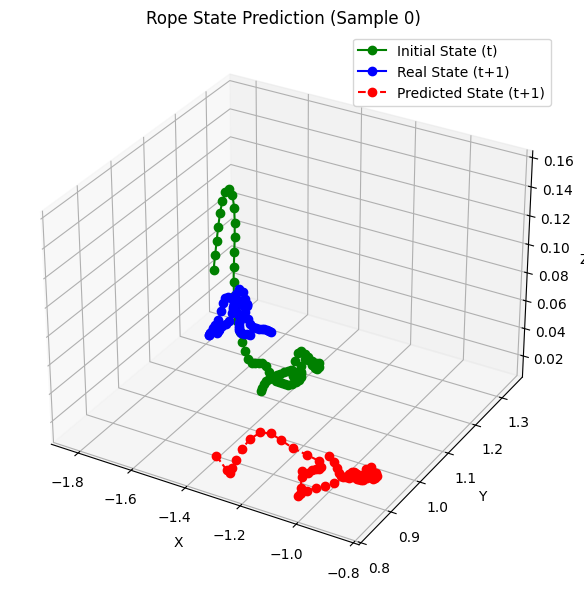

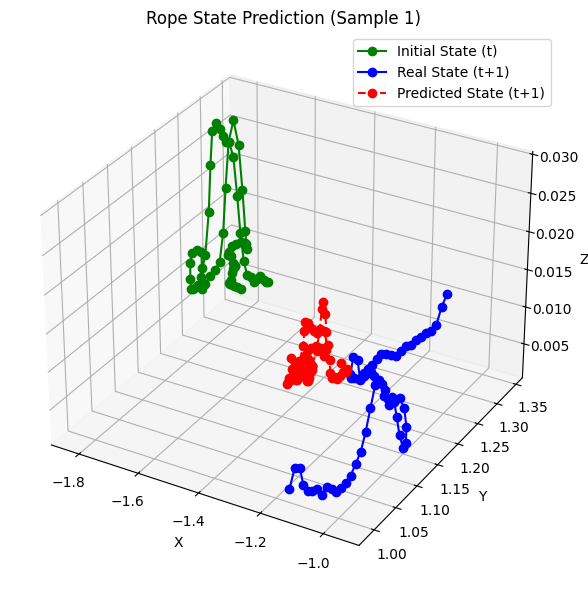

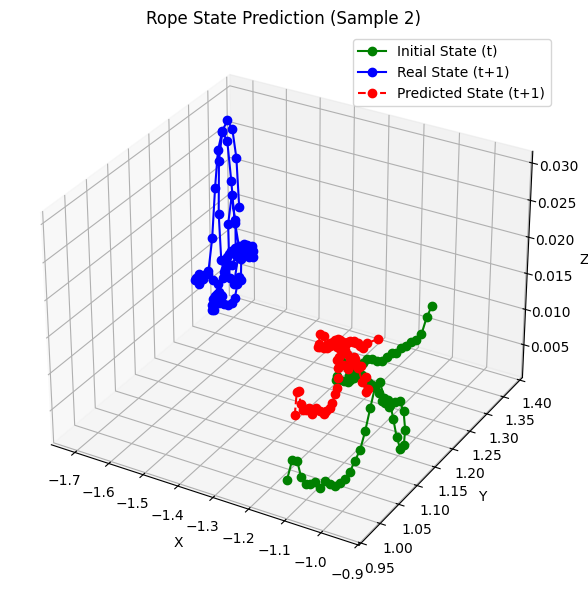

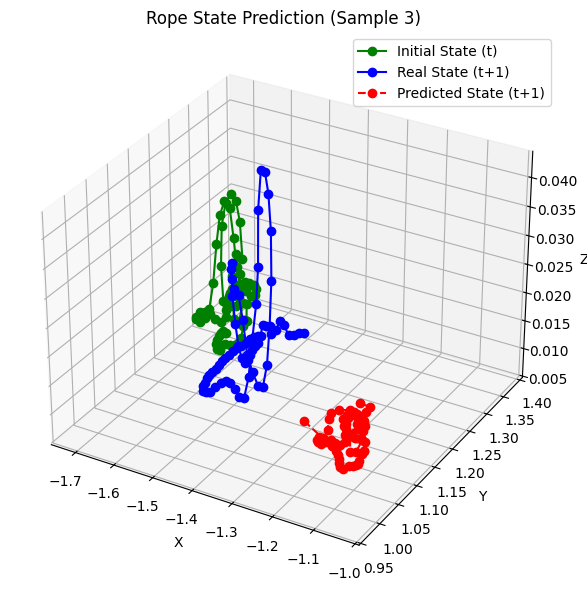

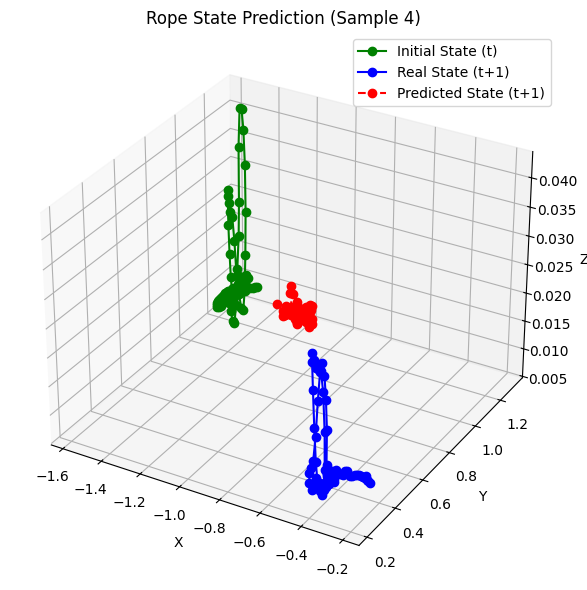

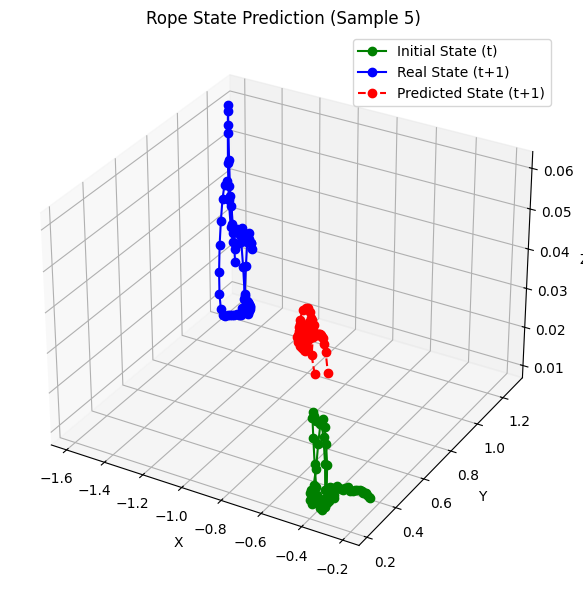

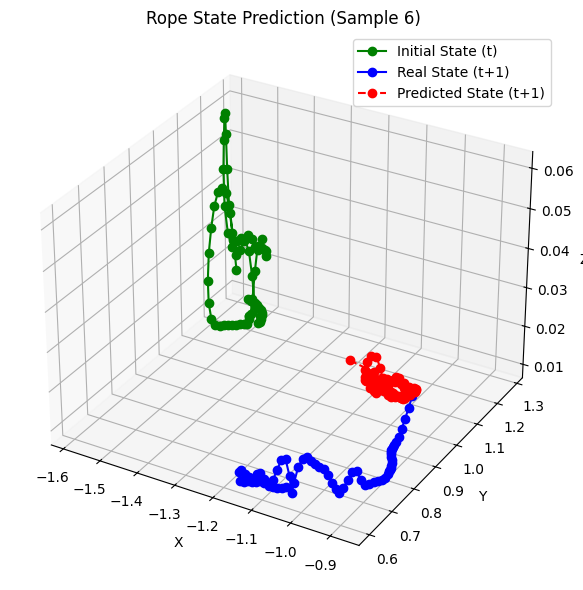

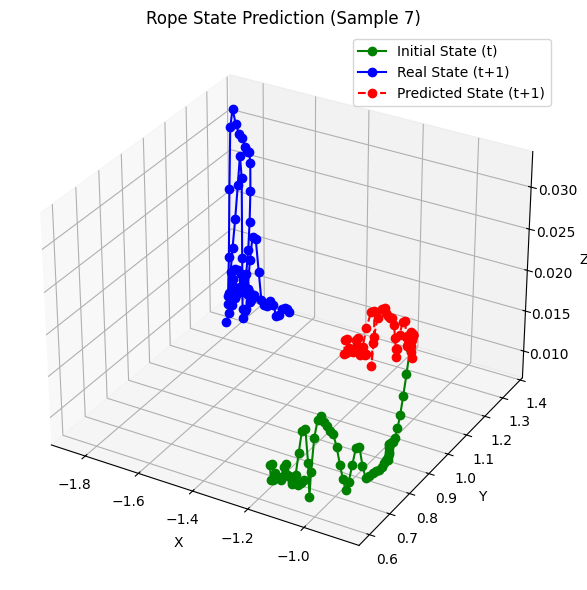

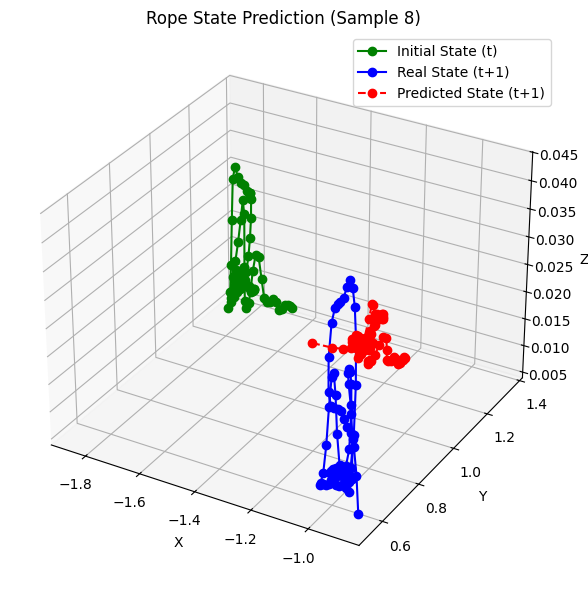

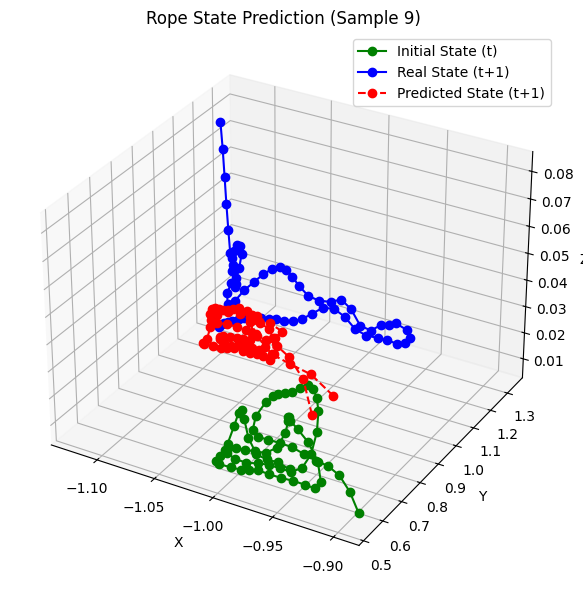

In [ ]:
import time

for i in range(10):
  plot_rope_predictions(trained, test_dataset, index = i,train_mean=train_dataset.mean,train_std=train_dataset.std)

In [ ]:
html_anim = animate_rope(trained, demo_dataset , start_idx=0, steps=48, interval=120, train_mean=train_dataset.mean,train_std=train_dataset.std, save = True)
html_anim

Saved animation as rope_animation.mp4


In [ ]:
import torch
import torch.nn as nn
import math


class RopeBiLSTMSeq2Seq(nn.Module):
    """
    Encoder-decoder model for rope dynamics using only BiLSTMs.
    (state_t, action_t) -> state_{t+1}

    Encoder input: (xyz + per-link action)
    Decoder input: previous xyz (teacher forcing)
    Output: delta prediction -> residual addition with src_state + action_res
    """

    def __init__(
        self,
        seq_len: int = 70,
        d_model: int = 256,
        num_layers: int = 2,
        dropout: float = 0.1,
    ):
        super().__init__()
        self.d_model = d_model
        self.seq_len = seq_len
        self.num_layers = num_layers

        # --- Encoder ---
        self.enc_input_fc = nn.Linear(3 + 4, d_model)  # xyz + action(4)
        self.encoder = nn.LSTM(
            input_size=d_model,
            hidden_size=d_model // 2,  # bidirectional ⇒ output = d_model
            num_layers=num_layers,
            batch_first=True,
            bidirectional=True,
            dropout=dropout if num_layers > 1 else 0.0,
        )

        # --- Decoder ---
        self.dec_input_fc = nn.Linear(3, d_model)
        self.decoder = nn.LSTM(
            input_size=d_model,
            hidden_size=d_model // 2,
            num_layers=num_layers,
            batch_first=True,
            bidirectional=True,
            dropout=dropout if num_layers > 1 else 0.0,
        )

        # --- Output ---
        self.output_fc = nn.Linear(d_model, 3)

    def forward(
        self,
        src_state: torch.Tensor,     # (B, L, 3)
        action_map: torch.Tensor,    # (B, L, 4)
        decoder_inputs: torch.Tensor = None,  # (B, L, 3)
    ) -> torch.Tensor:
        """
        Args:
            src_state: (batch, L, 3) - current rope state
            action_map: (batch, L, 4) - per-link action vector
            decoder_inputs: (batch, L, 3) - previous state for teacher forcing
        Returns:
            pred_next_state: (batch, L, 3)
        """
        B, L, _ = src_state.shape

        # --- Encode ---
        src_cat = torch.cat([src_state, action_map], dim=-1)  # (B, L, 7)
        enc_in = self.enc_input_fc(src_cat)
        enc_out, (h_enc, c_enc) = self.encoder(enc_in)  # (B, L, d_model)

        # --- Decode ---
        if decoder_inputs is None:
            decoder_inputs = src_state  # teacher forcing fallback

        dec_in = self.dec_input_fc(decoder_inputs)
        dec_out, _ = self.decoder(dec_in, (h_enc, c_enc))  # (B, L, d_model)

        # --- Delta prediction ---
        delta = self.output_fc(dec_out)  # (B, L, 3)

        # --- Residual prediction ---
        pred_next_state = src_state + delta

        return pred_next_state


In [ ]:
L = 70
set_seed(42)


# 🔹 Split data into train, val, and test sets
(rope_train, rope_val, rope_test), (actions_train, actions_val, actions_test), (rope_demo, actions_demo) = split_data(rope_states, actions)

# 🔹 Create datasets
train_dataset = RopeDataset(rope_train, actions_train, normalize=True)
val_dataset = RopeDataset(rope_val, actions_val, normalize=False, mean=train_dataset.mean, std=train_dataset.std)
test_dataset = RopeDataset(rope_test, actions_test, normalize=False, mean=train_dataset.mean, std=train_dataset.std)

# 🔹 Initialize model
model = RopeBiLSTMSeq2Seq(seq_len = 70,
        d_model = 64,
        num_layers = 2,
        dropout= 0.2)

# 🔹 Train model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
trained = train(model, train_dataset, val_dataset, device=device, batch_size=64, epochs=100, lr=5e-4)

# 🔹 Save model and normalization stats
out_dir = "rope_transformer_out"
os.makedirs(out_dir, exist_ok=True)
torch.save({
    "model_state_dict": trained.state_dict(),
    "mean": train_dataset.mean,
    "std": train_dataset.std,
}, os.path.join(out_dir, "model.pth"))

print("✅ Training complete.")

# 🔹 Evaluate on test set
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)
mse_test = evaluate(trained, test_loader, device=device)
print(f"Final Test MSE (normalized coords): {mse_test:.6f}")

Epoch 001 finished. Train Loss: 1.627.Validation MSE=1.481502
✅ Saved new best model (MSE=1.481502) at 'best_model.pt'
Epoch 002 finished. Train Loss: 1.193.Validation MSE=1.276644
✅ Saved new best model (MSE=1.276644) at 'best_model.pt'
Epoch 003 finished. Train Loss: 1.093.Validation MSE=1.211018
✅ Saved new best model (MSE=1.211018) at 'best_model.pt'
Epoch 004 finished. Train Loss: 1.063.Validation MSE=1.185359
✅ Saved new best model (MSE=1.185359) at 'best_model.pt'
Epoch 005 finished. Train Loss: 1.048.Validation MSE=1.171817
✅ Saved new best model (MSE=1.171817) at 'best_model.pt'
Epoch 006 finished. Train Loss: 1.039.Validation MSE=1.161275
✅ Saved new best model (MSE=1.161275) at 'best_model.pt'
Epoch 007 finished. Train Loss: 1.032.Validation MSE=1.153362
✅ Saved new best model (MSE=1.153362) at 'best_model.pt'
Epoch 008 finished. Train Loss: 1.028.Validation MSE=1.147498
✅ Saved new best model (MSE=1.147498) at 'best_model.pt'
Epoch 009 finished. Train Loss: 1.025.Validation

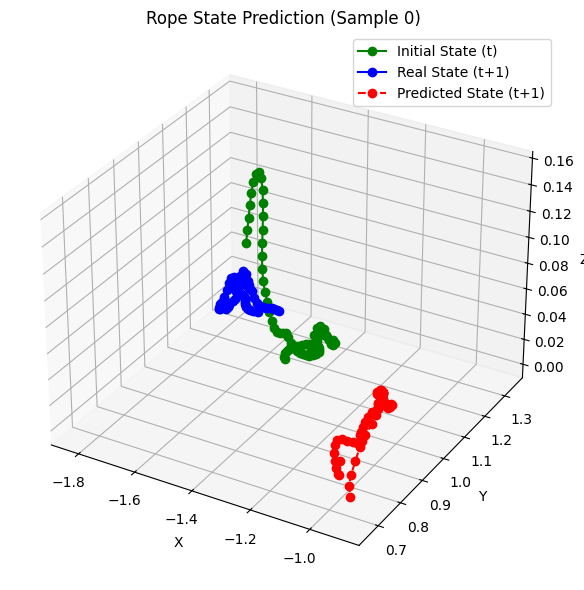

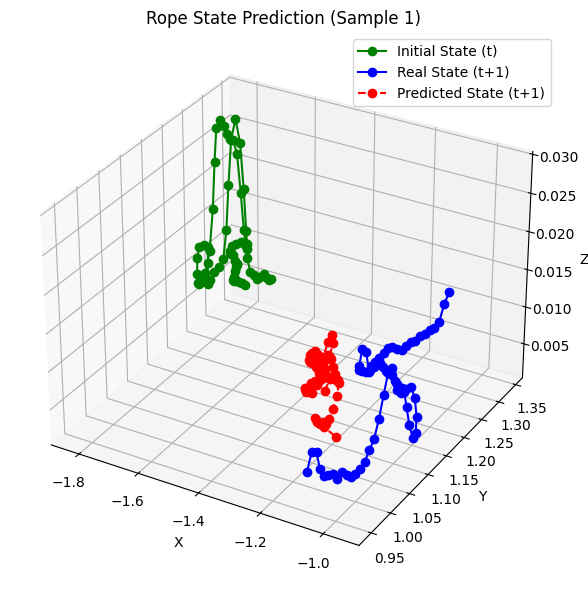

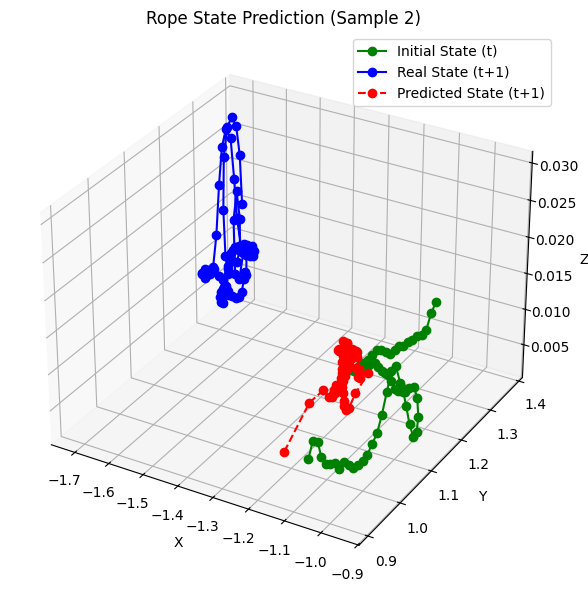

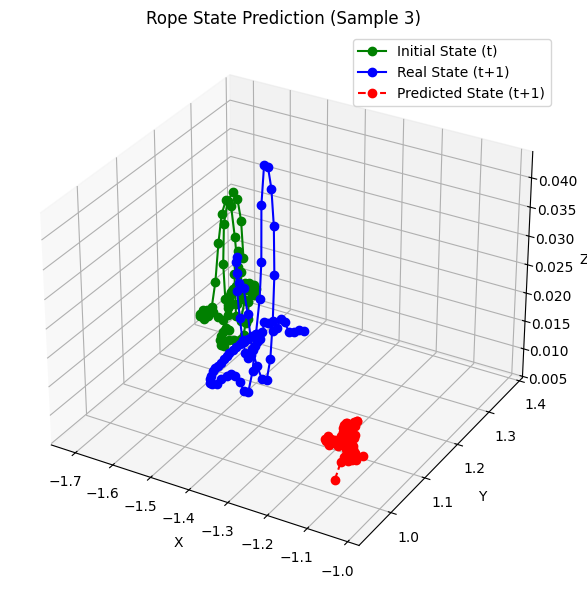

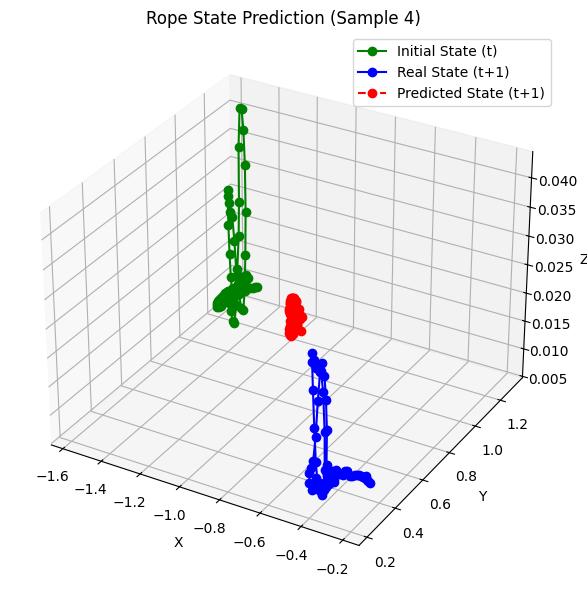

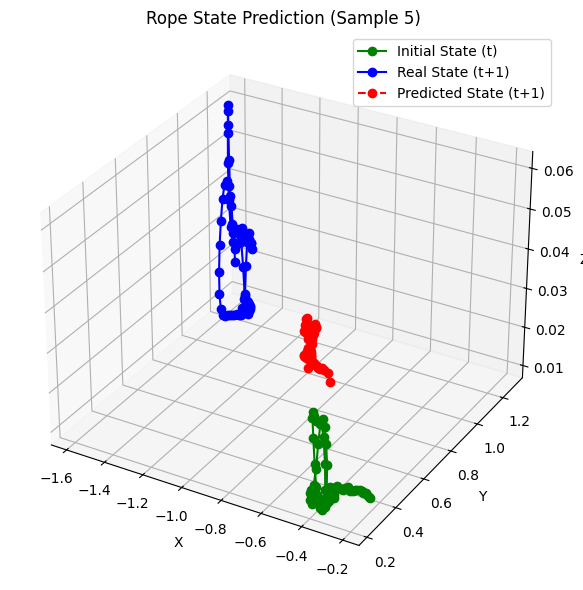

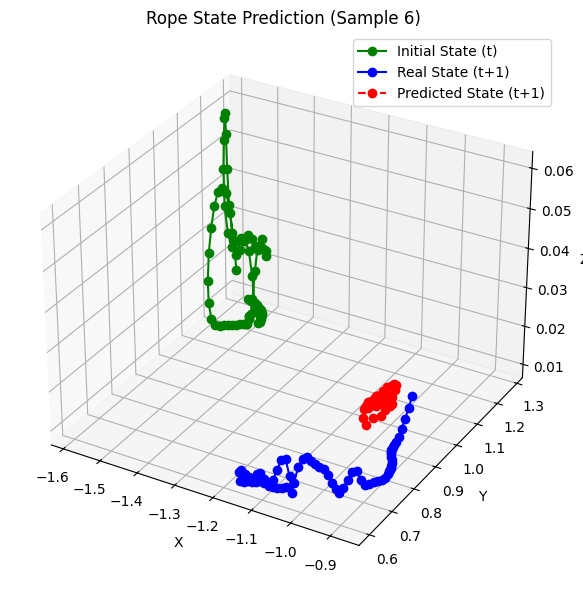

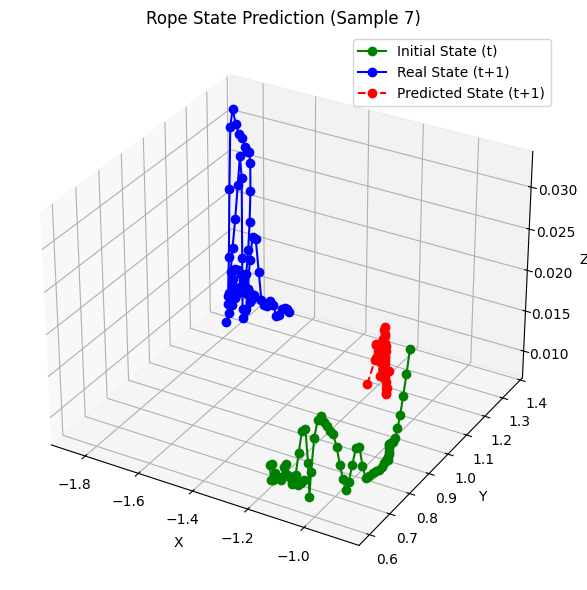

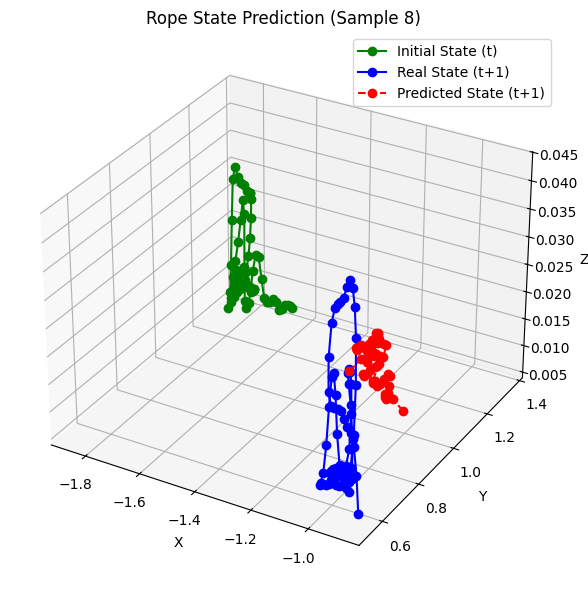

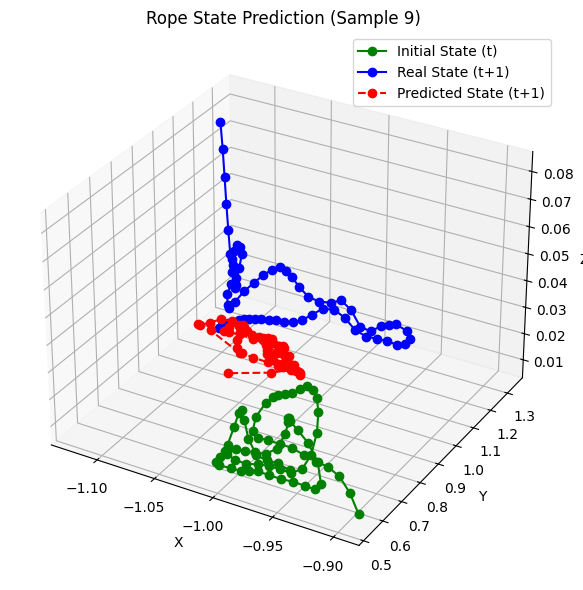

In [ ]:
import time

for i in range(10):
  plot_rope_predictions(trained, test_dataset, index = i,train_mean=train_dataset.mean,train_std=train_dataset.std)

In [ ]:
html_anim = animate_rope(trained, demo_dataset , start_idx=0, steps=48, interval=120, train_mean=train_dataset.mean,train_std=train_dataset.std, save = True)
html_anim

Saved animation as rope_animation.mp4
